In [ ]:
import rdkit
from rdkit.Chem import Descriptors
from rdkit.Chem import Lipinski
from rdkit import Chem
from rdkit.Chem import RDConfig
from rdkit.Chem import rdChemReactions
from rdkit.Chem import AllChem
from rdkit.Chem import Draw,BRICS,Recap
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import rdmolops
from rdkit.Chem.BRICS import BRICSDecompose
from rdkit import Chem
from rdkit import DataStructs
from rdkit.Chem.Fingerprints import FingerprintMols
from rdkit.Chem import QED
import pandas as pd
import numpy as np


In [63]:
df = pd.read_excel('D:\drug_modelling\\big_data.xlsx')
df['SMILE']= df['SMILES']
df['pic50'] = 6 - np.log10(df['Mean_50uM'])
df

,SMILES,Mean_50uM,SMILE,pic50
0,Nc1nnc(o1)-c1ccc(o1)[N+](=O)[O-],0.088975,Nc1nnc(o1)-c1ccc(o1)[N+](=O)[O-],7.050734
1,O[C@H]1COC[C@@H]2O[C@H](CC[C@H]2N(C1)C(=O)Nc1c...,0.090625,O[C@H]1COC[C@@H]2O[C@H](CC[C@H]2N(C1)C(=O)Nc1c...,7.042751
2,CC(C)C[C@@H](N)C(=O)N[C@@H]1[C@H](O)c2ccc(c(c2...,0.091557,CC(C)C[C@@H](N)C(=O)N[C@@H]1[C@H](O)c2ccc(c(c2...,7.038310
3,[O-][N+](=O)c1ccc(o1)/C=N/N1CC(=O)NC1=O,0.092539,[O-][N+](=O)c1ccc(o1)/C=N/N1CC(=O)NC1=O,7.033676
4,Cn1cnc(c1)CCNC(=O)C[C@@H]1CC[C@@H]2[C@H](COC[C...,0.092865,Cn1cnc(c1)CCNC(=O)C[C@@H]1CC[C@@H]2[C@H](COC[C...,7.032146
...,...,...,...,...
39307,COc1cc(ccc1NN=C1C=Cc2c(c(c(cc2S(=O)(=O)O)S(=O)...,4.124674,COc1cc(ccc1NN=C1C=Cc2c(c(c(cc2S(=O)(=O)O)S(=O)...,5.384610
39308,CN(C)c1ccc(C(=C2C=CC(=[N+](C)C)C=C2)c2ccc(N(C)...,5.036600,CN(C)c1ccc(C(=C2C=CC(=[N+](C)C)C=C2)c2ccc(N(C)...,5.297863
39309,COC(=O)CCc1c(c/2[nH]c1/C=C/1\N=C(/C=C/3\N=C(/C...,5.921118,COC(=O)CCc1c(c/2[nH]c1/C=C/1\N=C(/C=C/3\N=C(/C...,5.227596
39310,Cc1cc(-c2ccc(N=Nc3ccc4c(S(=O)(=O)[O-])cc(S(=O)...,6.274550,Cc1cc(-c2ccc(N=Nc3ccc4c(S(=O)(=O)[O-])cc(S(=O)...,5.202417


In [ ]:

df = pd.read_excel('D:\drug_modelling\Oxazolidinone.xlsx')
df.drop([0],inplace = True)
df.drop({'Unnamed: 0'},axis = 1, inplace = True)
df.rename({'Unnamed: 3':'MIC'},inplace=True,axis = 1)
df.dropna(inplace = True)
df['pic50']=6-np.log(df['MIC'])
df.reset_index(inplace = True,drop = True)
display(df)

,SMILE,Compound,MIC,pic50
0,NC1=CN=C(C=NN2CCN(C3=CC=C(N4C[C@H](CNC(C)=O)OC...,2a,10.00,3.697415
1,CC1=NC=C([N+]([O-])=O)N1CC=NN2CCN(C3=CC=C(N4C[...,2b,1.00,6.000000
2,CC1=NC=C([N+]([O-])=O)N1CC(C)=NN2CCN(C3=CC=C(N...,2c,1.00,6.000000
3,O=C(C)NC[C@H](OC1=O)CN1C(C=C2F)=CC=C2N3CCN(/N=...,2d,0.25,7.386294
4,O=C(C)NC[C@H](OC1=O)CN1C(C=C2F)=CC=C2N3CCN(/N=...,2e,0.25,7.386294
...,...,...,...,...
228,S=C(NC1=CC=C(F)C=C1)NC2=CC=C(C[C@]3(C)NC(OC3)=...,53d,65.00,1.825613
229,S=C(NC1=CC=C(I)C=C1)NC2=CC=C(C[C@]3(C)NC(OC3)=...,53e,65.00,1.825613
230,S=C(NC1=CC=C(OC)C=C1)NC2=CC=C(C[C@]3(C)NC(OC3)...,53f,50.00,2.087977
231,S=C(NC1=CC=C(C)C=C1)NC2=CC=C(C[C@]3(C)NC(OC3)=...,53g,65.00,1.825613


In [64]:
from rdkit import Chem
from rdkit.Chem import SaltRemover
from rdkit.Chem.MolStandardize import rdMolStandardize

def standardize_smiles(smiles):
    # Remove salts and neutralize charges
    remover = SaltRemover.SaltRemover()
    mol = Chem.MolFromSmiles(smiles)
    if not mol:
        return None
    
    clean_mol = remover.StripMol(mol)
    # Use the correct function name from rdMolStandardize
    clean_mol = rdMolStandardize.ChargeParent(clean_mol)
    
    # Standardize tautomers
    enumerator = rdMolStandardize.TautomerEnumerator()
    return enumerator.Canonicalize(clean_mol)

# Assuming df contains a column 'SMILE'
df['standard_smiles'] = df['SMILE'].apply(standardize_smiles)
df = df.dropna(subset=['standard_smiles'])
display(df)



[00:44:14] Initializing MetalDisconnector
[00:44:14] Running MetalDisconnector
[00:44:14] Initializing Normalizer
[00:44:14] Running Normalizer
[00:44:14] Running LargestFragmentChooser
[00:44:14] Running Uncharger
[00:44:14] Initializing MetalDisconnector
[00:44:14] Running MetalDisconnector
[00:44:14] Initializing Normalizer
[00:44:14] Running Normalizer
[00:44:14] Initializing MetalDisconnector
[00:44:14] Running MetalDisconnector
[00:44:14] Initializing Normalizer
[00:44:14] Running Normalizer
[00:44:14] Running LargestFragmentChooser
[00:44:14] Running Uncharger
[00:44:14] Initializing MetalDisconnector
[00:44:14] Running MetalDisconnector
[00:44:14] Initializing Normalizer
[00:44:14] Running Normalizer
[00:44:14] Initializing MetalDisconnector
[00:44:14] Running MetalDisconnector
[00:44:14] Initializing Normalizer
[00:44:14] Running Normalizer
[00:44:14] Running LargestFragmentChooser
[00:44:14] Running Uncharger
[00:44:14] Initializing MetalDisconnector
[00:44:14] Running MetalD

,SMILES,Mean_50uM,SMILE,pic50,standard_smiles
0,Nc1nnc(o1)-c1ccc(o1)[N+](=O)[O-],0.088975,Nc1nnc(o1)-c1ccc(o1)[N+](=O)[O-],7.050734,<rdkit.Chem.rdchem.Mol object at 0x000001F6B79...
1,O[C@H]1COC[C@@H]2O[C@H](CC[C@H]2N(C1)C(=O)Nc1c...,0.090625,O[C@H]1COC[C@@H]2O[C@H](CC[C@H]2N(C1)C(=O)Nc1c...,7.042751,<rdkit.Chem.rdchem.Mol object at 0x000001F6B79...
2,CC(C)C[C@@H](N)C(=O)N[C@@H]1[C@H](O)c2ccc(c(c2...,0.091557,CC(C)C[C@@H](N)C(=O)N[C@@H]1[C@H](O)c2ccc(c(c2...,7.038310,<rdkit.Chem.rdchem.Mol object at 0x000001F68CD...
3,[O-][N+](=O)c1ccc(o1)/C=N/N1CC(=O)NC1=O,0.092539,[O-][N+](=O)c1ccc(o1)/C=N/N1CC(=O)NC1=O,7.033676,<rdkit.Chem.rdchem.Mol object at 0x000001F6B7A...
4,Cn1cnc(c1)CCNC(=O)C[C@@H]1CC[C@@H]2[C@H](COC[C...,0.092865,Cn1cnc(c1)CCNC(=O)C[C@@H]1CC[C@@H]2[C@H](COC[C...,7.032146,<rdkit.Chem.rdchem.Mol object at 0x000001F6B7A...
...,...,...,...,...,...
39307,COc1cc(ccc1NN=C1C=Cc2c(c(c(cc2S(=O)(=O)O)S(=O)...,4.124674,COc1cc(ccc1NN=C1C=Cc2c(c(c(cc2S(=O)(=O)O)S(=O)...,5.384610,<rdkit.Chem.rdchem.Mol object at 0x000001F6B7E...
39308,CN(C)c1ccc(C(=C2C=CC(=[N+](C)C)C=C2)c2ccc(N(C)...,5.036600,CN(C)c1ccc(C(=C2C=CC(=[N+](C)C)C=C2)c2ccc(N(C)...,5.297863,<rdkit.Chem.rdchem.Mol object at 0x000001F6B7E...
39309,COC(=O)CCc1c(c/2[nH]c1/C=C/1\N=C(/C=C/3\N=C(/C...,5.921118,COC(=O)CCc1c(c/2[nH]c1/C=C/1\N=C(/C=C/3\N=C(/C...,5.227596,<rdkit.Chem.rdchem.Mol object at 0x000001F6B7E...
39310,Cc1cc(-c2ccc(N=Nc3ccc4c(S(=O)(=O)[O-])cc(S(=O)...,6.274550,Cc1cc(-c2ccc(N=Nc3ccc4c(S(=O)(=O)[O-])cc(S(=O)...,5.202417,<rdkit.Chem.rdchem.Mol object at 0x000001F6B7E...


In [48]:
#!pip install mordred

In [49]:
'''from rdkit.Chem import AllChem, Descriptors
from mordred import Calculator, descriptors

# Morgan Fingerprints (ECFP6)
def get_morgan_fp(mol):
    return AllChem.GetMorganFingerprintAsBitVect(mol, radius=3, nBits=4096)

# Mordred Descriptors (1826 features)
calc = Calculator(descriptors, ignore_3D=True)
def get_mordred_desc(mol):
    return calc(mol).fill_missing()

# Combine features
X_fp = np.array([get_morgan_fp(s) for s in df['standard_smiles']])
X_desc = np.array([get_mordred_desc(s) for s in df['standard_smiles']])
X_combined = np.hstack([X_fp, X_desc])'''


In [65]:
len(df['standard_smiles'])


39312

d:\drug_modelling\gflow_venv\lib\site-packages\rdkit\Chem\Draw\IPythonConsole.py:261: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(


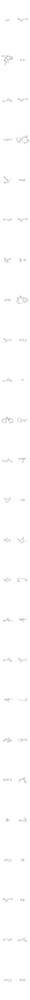

In [66]:
molecules = [mols for mols in df['standard_smiles']]
if None in molecules:
    print("yes")
img = Draw.MolsToGridImage(molecules, molsPerRow=2, subImgSize=(300, 800))

img

In [67]:
import pandas as pd
import numpy as np
from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

# Custom transformer to convert SMILES to Morgan fingerprints
class MorganFingerprintTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, radius=2, n_bits=2048):
        self.radius = radius
        self.n_bits = n_bits

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        fps = []
        for mol in X:
            #mol = Chem.MolFromSmiles(smi)
            if mol is None:
                # You can decide to handle invalid SMILES differently
                fps.append(np.zeros((self.n_bits,)))
            else:
                fp = AllChem.GetMorganFingerprintAsBitVect(mol, self.radius, nBits=self.n_bits)
                arr = np.zeros((self.n_bits,), dtype=int)
                DataStructs.ConvertToNumpyArray(fp, arr)
                fps.append(arr)
        return np.array(fps)

# Load dataset
df = df

# Define pipeline
pipeline = Pipeline([
    ('fingerprint', MorganFingerprintTransformer(radius=2, n_bits=2048)),
    ('regressor', RandomForestRegressor(n_estimators=200, random_state=42))
])

# Split data
X = df['standard_smiles'].values
y = df['pic50'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train the pipeline
pipeline.fit(X_train, y_train)

# Evaluate
y_pred = pipeline.predict(X_test)
print("Pipeline Test MSE:", mean_squared_error(y_test, y_pred))
print("Pipeline Test R²:", r2_score(y_test, y_pred))
y_pred = pipeline.predict(X_train)
print("Pipeline Test MSE:", mean_squared_error(y_train, y_pred))
print("Pipeline Test R²:", r2_score(y_train, y_pred))

KeyboardInterrupt: 

In [ ]:
import pandas as pd
import numpy as np
from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

# Custom transformer to convert SMILES (RDKit Mol objects) to Morgan fingerprints
class MorganFingerprintTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, radius=2, n_bits=2048):
        self.radius = radius
        self.n_bits = n_bits

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        fps = []
        for mol in X:
            # We assume that each entry in X is an RDKit Mol object.
            if mol is None:
                # Handle invalid entries by appending a zero vector.
                fps.append(np.zeros((self.n_bits,)))
            else:
                fp = AllChem.GetMorganFingerprintAsBitVect(mol, self.radius, nBits=self.n_bits)
                arr = np.zeros((self.n_bits,), dtype=int)
                DataStructs.ConvertToNumpyArray(fp, arr)
                fps.append(arr)
        return np.array(fps)

# Assume df is your DataFrame containing 'standard_smiles' (as RDKit Mol objects) and 'pic50'
# If you have SMILES strings, make sure to convert them to Mol objects first:
# df['standard_smiles'] = df['SMILE'].apply(Chem.MolFromSmiles)

# Define pipeline
pipeline = Pipeline([
    ('fingerprint', MorganFingerprintTransformer(radius=2, n_bits=2048)),
    ('regressor', RandomForestRegressor(n_estimators=200, random_state=42))
])

# Prepare data
X = df['standard_smiles'].values
y = df['pic50'].values

# Set up 5-fold cross-validation (each fold ~20% test split)
kf = KFold(n_splits=5, shuffle=True, random_state=42)

r2_scores = []
fold = 1
for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Train the pipeline on the current fold
    pipeline.fit(X_train, y_train)
    
    # Predict on the test set for this fold
    y_pred = pipeline.predict(X_test)
    
    # Compute R² score for this fold
    r2 = r2_score(y_test, y_pred)
    r2_scores.append(r2)
    print(f"Fold {fold} R²: {r2:.4f}")
    fold += 1

# Compute and print the average R² score across all folds
avg_r2 = np.mean(r2_scores)
print(f"\nAverage R² across all 5 folds: {avg_r2:.4f}")

RandomForest R²: 0.7390445739697675
GradientBoosting R²: 0.7198636162950642
SVR R²: 0.6093561598388646
Ensemble R²: 0.7378043100034182


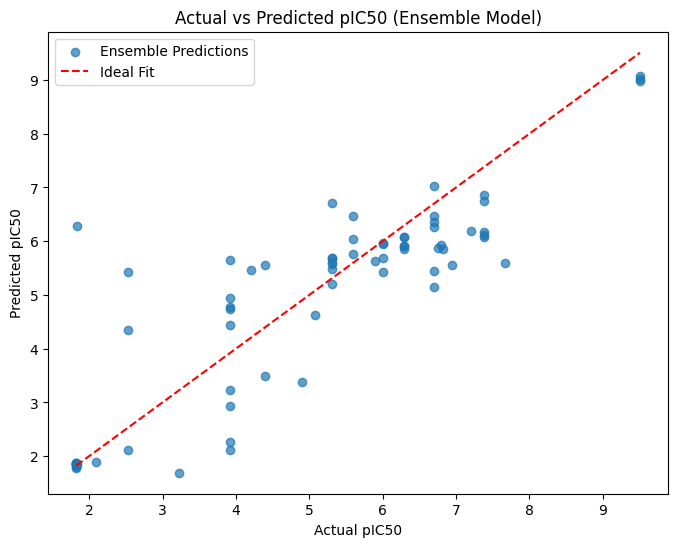

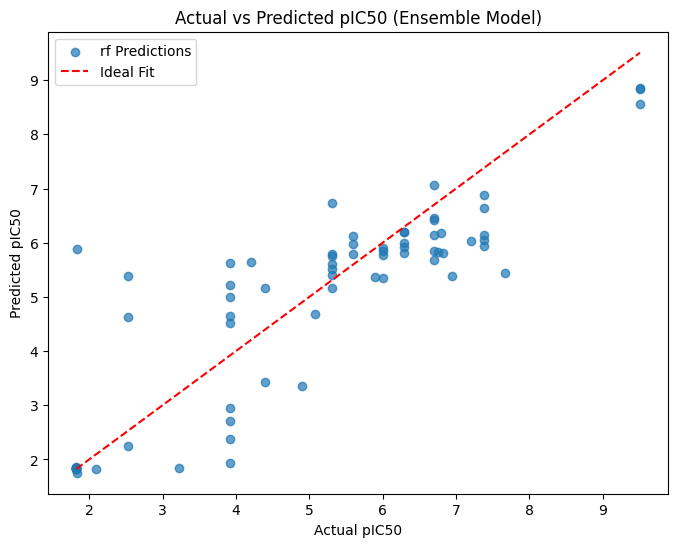

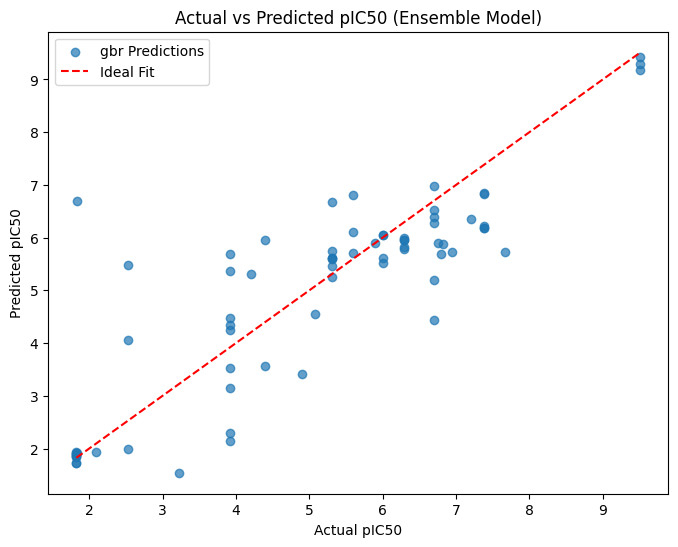

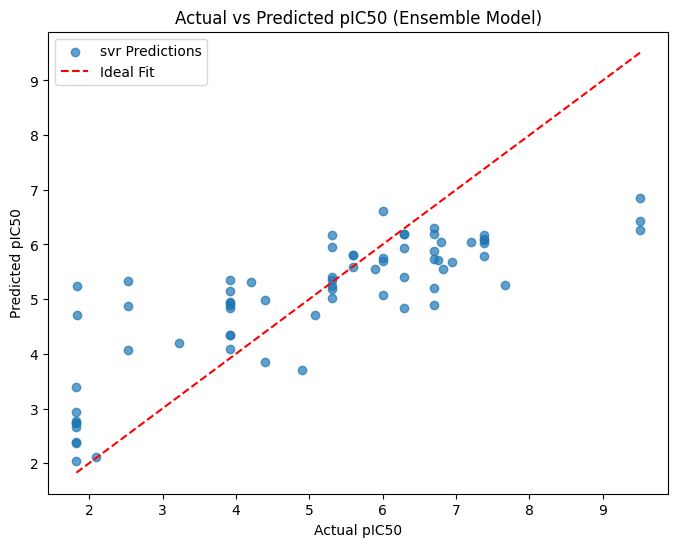

In [56]:
import pandas as pd
import numpy as np
from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt

# Custom transformer to convert SMILES (Mol objects) to Morgan fingerprints
class MorganFingerprintTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, radius=2, n_bits=2048):
        self.radius = radius
        self.n_bits = n_bits

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        fps = []
        for mol in X:
            # We assume that each entry in X is an RDKit Mol object.
            if mol is None:
                fps.append(np.zeros((self.n_bits,)))
            else:
                fp = AllChem.GetMorganFingerprintAsBitVect(mol, self.radius, nBits=self.n_bits)
                arr = np.zeros((self.n_bits,), dtype=int)
                DataStructs.ConvertToNumpyArray(fp, arr)
                fps.append(arr)
        return np.array(fps)

# Assume df is your DataFrame with columns 'standard_smiles' and 'pic50'
# 'standard_smiles' should be a column of RDKit Mol objects obtained after standardization
# 'pic50' is the target value

# Split the data into training and testing sets
X = df['standard_smiles'].values
y = df['pic50'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Pipeline for RandomForestRegressor
pipeline_rf = Pipeline([
    ('fingerprint', MorganFingerprintTransformer(radius=2, n_bits=2048)),
    ('regressor', RandomForestRegressor(n_estimators=200, random_state=42))
])

# Pipeline for GradientBoostingRegressor
pipeline_gbr = Pipeline([
    ('fingerprint', MorganFingerprintTransformer(radius=2, n_bits=2048)),
    ('regressor', GradientBoostingRegressor(n_estimators=200, random_state=42))
])

# Pipeline for SVR (using scaling)
pipeline_svr = Pipeline([
    ('fingerprint', MorganFingerprintTransformer(radius=2, n_bits=2048)),
    ('scaler', StandardScaler()),
    ('svr', SVR())
])

# Train the individual models
pipeline_rf.fit(X_train, y_train)
pipeline_gbr.fit(X_train, y_train)
pipeline_svr.fit(X_train, y_train)

# Predict on the test set
y_pred_rf = pipeline_rf.predict(X_test)
y_pred_gbr = pipeline_gbr.predict(X_test)
y_pred_svr = pipeline_svr.predict(X_test)

# Calculate R² scores for individual models
r2_rf  = r2_score(y_test, y_pred_rf)
r2_gbr = r2_score(y_test, y_pred_gbr)
r2_svr = r2_score(y_test, y_pred_svr)

print("RandomForest R²:", r2_rf)
print("GradientBoosting R²:", r2_gbr)
print("SVR R²:", r2_svr)

# Create an ensemble prediction (simple average of predictions)
y_pred_ensemble = (y_pred_rf + y_pred_gbr ) / 2.0
r2_ensemble = r2_score(y_test, y_pred_ensemble)
print("Ensemble R²:", r2_ensemble)

# Optionally, plot actual vs. predicted for the ensemble model
plt.figure(figsize=(8,6))
plt.scatter(y_test, y_pred_ensemble, alpha=0.7, label='Ensemble Predictions')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--', label='Ideal Fit')
plt.xlabel('Actual pIC50')
plt.ylabel('Predicted pIC50')
plt.title('Actual vs Predicted pIC50 (Ensemble Model)')
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.scatter(y_test, y_pred_rf, alpha=0.7, label='rf Predictions')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--', label='Ideal Fit')
plt.xlabel('Actual pIC50')
plt.ylabel('Predicted pIC50')
plt.title('Actual vs Predicted pIC50 (Ensemble Model)')
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.scatter(y_test, y_pred_gbr, alpha=0.7, label='gbr Predictions')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--', label='Ideal Fit')
plt.xlabel('Actual pIC50')
plt.ylabel('Predicted pIC50')
plt.title('Actual vs Predicted pIC50 (Ensemble Model)')
plt.legend()
plt.show()

plt.figure(figsize=(8,6))
plt.scatter(y_test, y_pred_svr, alpha=0.7, label='svr Predictions')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--', label='Ideal Fit')
plt.xlabel('Actual pIC50')
plt.ylabel('Predicted pIC50')
plt.title('Actual vs Predicted pIC50 (Ensemble Model)')
plt.legend()
plt.show()
